In [20]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
%matplotlib inline

import sys
import os

import numpy as np
import cv2
import h5py

from keras.models import Model
from keras.layers import Input, Lambda
from keras.layers.normalization import BatchNormalization
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers import concatenate
from keras.optimizers import Adam
from keras import backend as K

from skimage.measure import compare_psnr

In [21]:
import numpy as np

import tensorflow
import keras

from keras.models import Sequential, Model
from keras.engine.input_layer import Input
from keras.layers import Dense, Conv2D, BatchNormalization, LeakyReLU, Lambda, Concatenate

# credit to: https://github.com/sabakanation/DeepImagePrior
def reflection_padding(x, padding):
    reflected = Lambda(lambda x: x[:, :, ::-1, :])(x)
    reflected = Lambda(lambda x: x[:, :, :padding[1], :])(reflected)
    upper_row = concatenate([x, reflected], axis=2)
    lower_row = Lambda(lambda x: x[:, ::-1, :, :])(upper_row)
    lower_row = Lambda(lambda x: x[:, :padding[0], :, :])(lower_row)
    padded = concatenate([upper_row, lower_row], axis=1)
    return padded

def get_layer_size(x):
    height, width = x.get_shape()[1:3]
    height = int(height)
    width = int(width)
    return [height, width]

def Conv_BN_Act(layer, num_channels=128, kernel_size=3, strides=(1,1)):
    size = get_layer_size(layer)

    padding = [0, 0]
    padding[0] = (int(size[0]/strides[0]) - 1) * strides[0] + kernel_size - size[0]
    padding[1] = (int(size[1]/strides[1]) - 1) * strides[1] + kernel_size - size[1]
    layer = reflection_padding(layer, padding)

    layer = Conv2D(num_channels, kernel_size, strides=strides, padding='valid', activation=None)(layer)
    layer = BatchNormalization()(layer)
    layer = LeakyReLU(alpha=0.2)(layer)

    return layer

# mostly based on: https://github.com/beala/deep-image-prior-tensorflow
def down_layer(layer, num_channels=128, kernel_size=3):
    size = get_layer_size(layer)
    if size[0] % 2 != 0:
        layer = reflection_padding(layer, [1, 0])
    if size[1] % 2 != 0:
        layer = reflection_padding(layer, [0, 1])

    layer = Conv_BN_Act(layer, num_channels, kernel_size, (2, 2))
    layer = Conv_BN_Act(layer, num_channels, kernel_size, (1, 1))
    
    return layer

def up_layer(layer, num_channels=128, kernel_size=3, inter="bilinear"):
    layer = UpSampling2D(size=(2, 2))(layer)

    if inter == "bilinear":
        layer_padded = reflection_padding(layer, (1, 1))
        layer = Lambda(lambda x: (x[:, :-1, 1:, :] + x[:, 1:, :-1, :] + x[:, :-1, :-1, :] + x[:, :-1, :-1, :]) / 4.0)(layer_padded)

    layer = Conv_BN_Act(layer, num_channels, kernel_size, (1, 1))
    layer = Conv_BN_Act(layer, num_channels, 1, (1, 1))
    
    return layer

def skip(layer, num_channels=4, kernel_size=1):
    layer = Conv_BN_Act(layer, num_channels, kernel_size, (1, 1))
    return layer

def build_model(input_shape, num_depth, down_channels, up_channels, down_kernel, up_kernel, skip_channel, skip_kernel, inter):
    input_layer = Input(shape=input_shape)

    # Connect up all the downsampling layers.
    skips = []
    layer = input_layer
    size = get_layer_size(layer)
    sizes = [size]
    for i in range(num_depth):
        layer = down_layer(layer, down_channels[i], down_kernel[i])
        size = get_layer_size(layer)
        sizes.append(size)
        if skip_channel[i] != 0:
            skips.append(skip(layer, skip_channel[i], skip_kernel[i]))
        else:
            skips.append(None)
    print("Shape after downsample: " + str(layer.get_shape()))

    # Connect up the upsampling layers, from smallest to largest.
    for i in range(num_depth-1, -1, -1):
        if skip_channel[i] != 0:
            layer = concatenate([layer, skips[i]], axis=3)
        layer = up_layer(layer, up_channels[i], up_kernel[i], inter)
        size = get_layer_size(layer)

        if sizes[i] != size:
            layer = Lambda(lambda x: x[:, :sizes[i][0], :sizes[i][1], :])(layer)

    print("Shape after upsample: " + str(layer.get_shape()))

    # Restore original image dimensions and channels
    output_layer = Conv2D(3, 1, strides=1, padding='valid', activation=None)(layer)
    print("Output shape: " + str(output_layer.get_shape()))
    
    model = Model(inputs=input_layer, outputs=output_layer)

    return model

In [22]:
def define_inpainting_model(height, width):
    input_shape = (height, width, 2)
    num_depth = 5
    up_channels = [128, 128, 128, 128, 128]
    down_channels = [128, 128, 128, 128, 128]
    up_kernel = [3, 3, 3, 3, 3]
    down_kernel = [3, 3, 3, 3, 3]
    skip_channel = [0, 0, 0, 0, 0]
    skip_kernel = [0, 0, 0, 0, 0]
    lr = 0.01
    inter = "bilinear"

    base_model = build_model(input_shape, num_depth, down_channels, up_channels, down_kernel, up_kernel, skip_channel, skip_kernel, inter)
    
    masked_image = Input(shape=(height, width, 3))
    mask_image = Input(shape=(height, width, 1))

    loss = Lambda(lambda x: K.sum(K.square((x[0] - x[1]) * x[2]), axis=-1))([base_model.output, masked_image, mask_image])

    model = Model([base_model.input, masked_image, mask_image], loss)
    model.compile(loss="mean_absolute_error", optimizer=Adam(lr=lr))

    return model, base_model


# def inpainting(masked_image, mask_image):
#     height, width = masked_image.shape[:2]
#     model, base_model = define_inpainting_model(height, width)

#     y = np.linspace(0.0, 1.0, height)
#     x = np.linspace(0.0, 1.0, width)
#     XX, YY = np.meshgrid(x, y)
#     input_meshgrid = np.concatenate([XX[:,:,None], YY[:,:,None]], axis=2)

#     for i in range(5000):
#         model.train_on_batch([input_meshgrid[None, :, :, :], masked_image[None, :, :, :], mask_image[None, :, :, None]], np.zeros((1, 320, 320)))

#     inpainted_image = np.clip(base_model.predict(input_meshgrid[None, :, :, :])[0], 0, 255).astype(np.uint8)
#     return (masked_image * mask_image[:, :, None] + inpainted_image * (1 - mask_image[:, :, None])).astype(np.uint8)



In [4]:
masked_name = 'data/inpainting/kate_masked.png'
mask_name = 'data/inpainting/kate_mask.png'
fname = 'data/inpainting/kate.png'
# inpainted_name = sys.argv[3]

image = cv2.imread(fname)
masked_image = cv2.imread(masked_name)
mask_image = cv2.imread(mask_name, cv2.IMREAD_GRAYSCALE) / 255.0
# inpainted_image = inpainting(masked_image, mask_image)
# cv2.imwrite(inpainted_name, inpainted_image)

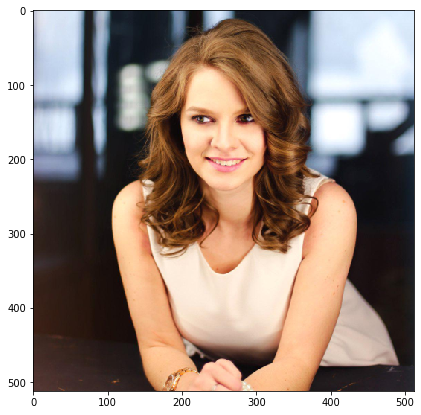

In [5]:
plt.figure(figsize=(7, 7))
plt.imshow(image[:,:,::-1])
plt.show()

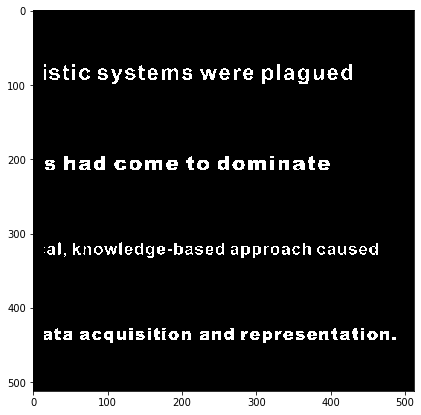

In [6]:
plt.figure(figsize=(7, 7))
plt.imshow(mask_image, cmap="Greys")
plt.show()

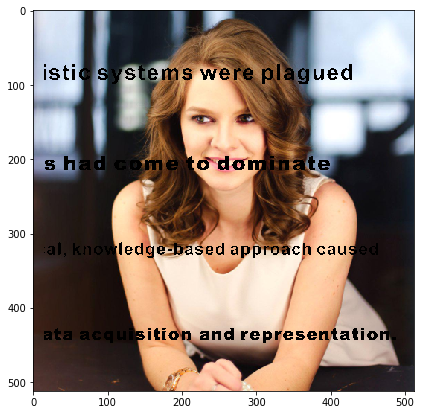

In [7]:
plt.figure(figsize=(7, 7))
plt.imshow(masked_image[:,:,::-1])
plt.show()

In [12]:
print(height, width)

512 512


In [23]:
height, width = masked_image.shape[:2]
model, base_model = define_inpainting_model(height, width)

y = np.linspace(0.0, 1.0, height)
x = np.linspace(0.0, 1.0, width)
XX, YY = np.meshgrid(x, y)
input_meshgrid = np.concatenate([XX[:,:,None], YY[:,:,None]], axis=2)

Shape after downsample: (?, 16, 16, 128)
Shape after upsample: (?, 512, 512, 128)
Output shape: (?, 512, 512, 3)


In [24]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 512, 512, 2)  0                                            
__________________________________________________________________________________________________
lambda_213 (Lambda)             (None, 512, 512, 2)  0           input_7[0][0]                    
__________________________________________________________________________________________________
lambda_214 (Lambda)             (None, 512, 1, 2)    0           lambda_213[0][0]                 
__________________________________________________________________________________________________
concatenate_101 (Concatenate)   (None, 512, 513, 2)  0           input_7[0][0]                    
                                                                 lambda_214[0][0]                 
__________

In [25]:
base_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 512, 512, 2)  0                                            
__________________________________________________________________________________________________
lambda_213 (Lambda)             (None, 512, 512, 2)  0           input_7[0][0]                    
__________________________________________________________________________________________________
lambda_214 (Lambda)             (None, 512, 1, 2)    0           lambda_213[0][0]                 
__________________________________________________________________________________________________
concatenate_101 (Concatenate)   (None, 512, 513, 2)  0           input_7[0][0]                    
                                                                 lambda_214[0][0]                 
__________

concatenate_130 (Concatenate)   (None, 66, 66, 128)  0           concatenate_129[0][0]            
                                                                 lambda_274[0][0]                 
__________________________________________________________________________________________________
conv2d_55 (Conv2D)              (None, 64, 64, 128)  147584      concatenate_130[0][0]            
__________________________________________________________________________________________________
batch_normalization_53 (BatchNo (None, 64, 64, 128)  512         conv2d_55[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_53 (LeakyReLU)      (None, 64, 64, 128)  0           batch_normalization_53[0][0]     
__________________________________________________________________________________________________
lambda_275 (Lambda)             (None, 64, 64, 128)  0           leaky_re_lu_53[0][0]             
__________

conv2d_62 (Conv2D)              (None, 512, 512, 128 16512       concatenate_150[0][0]            
__________________________________________________________________________________________________
batch_normalization_60 (BatchNo (None, 512, 512, 128 512         conv2d_62[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_60 (LeakyReLU)      (None, 512, 512, 128 0           batch_normalization_60[0][0]     
__________________________________________________________________________________________________
conv2d_63 (Conv2D)              (None, 512, 512, 3)  387         leaky_re_lu_60[0][0]             
Total params: 2,161,795
Trainable params: 2,156,675
Non-trainable params: 5,120
__________________________________________________________________________________________________


Iter # 0 , PSRN NOISY:  18.38479320240417 ; PSRN GT:  28.789718012506835


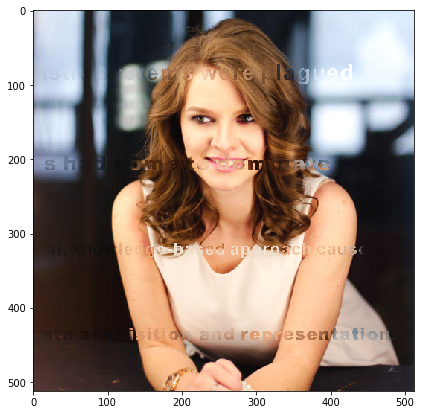

Iter # 20 , PSRN NOISY:  18.66470869442501 ; PSRN GT:  29.56338780809506


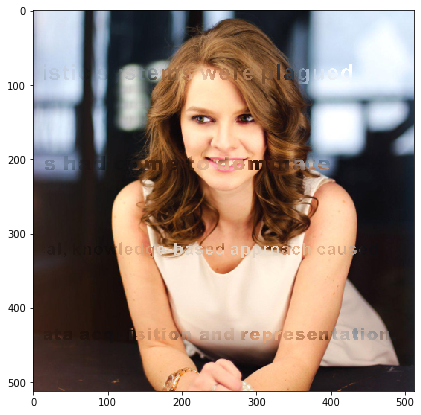

Iter # 40 , PSRN NOISY:  18.453055346485904 ; PSRN GT:  30.250030171409314


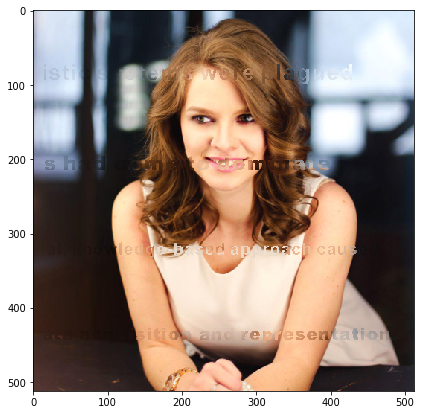

Iter # 60 , PSRN NOISY:  18.352524011248896 ; PSRN GT:  30.826453369280603


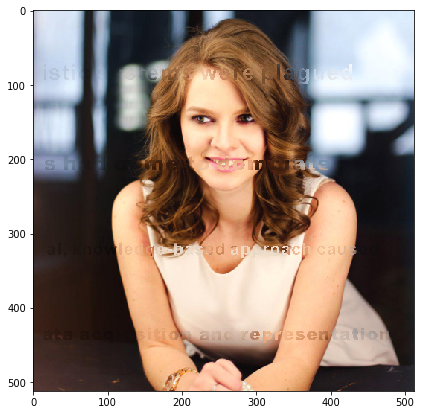

Iter # 80 , PSRN NOISY:  18.09722921932645 ; PSRN GT:  31.721511426741415


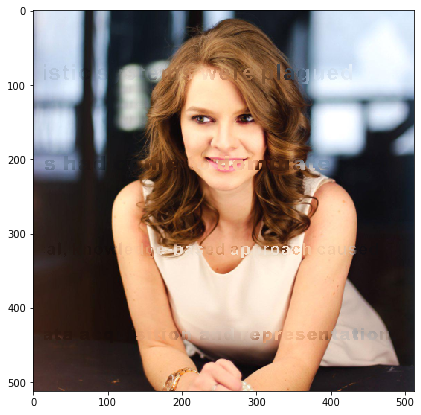

Iter # 100 , PSRN NOISY:  18.321544241561675 ; PSRN GT:  32.05039056530639


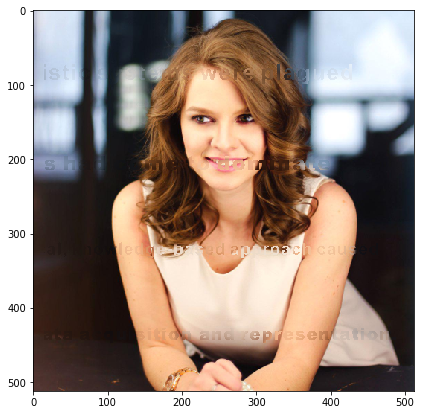

Iter # 120 , PSRN NOISY:  18.234937046565 ; PSRN GT:  32.88576585465173


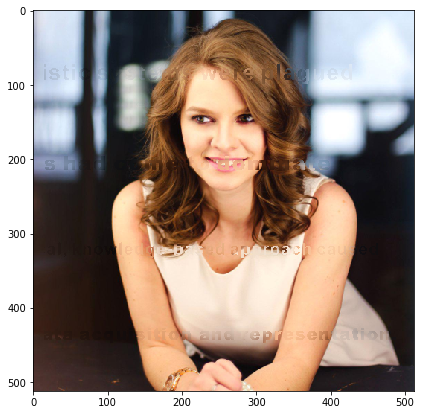

Iter # 140 , PSRN NOISY:  18.155248446920638 ; PSRN GT:  33.700217580214776


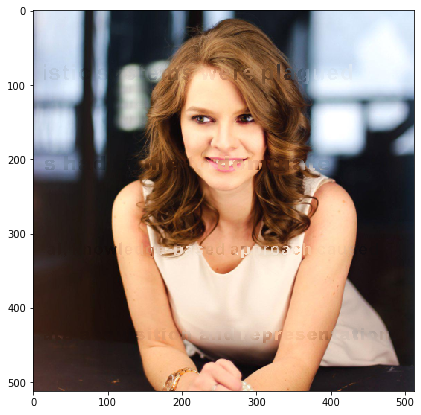

Iter # 160 , PSRN NOISY:  18.276041954216026 ; PSRN GT:  34.50742566756897


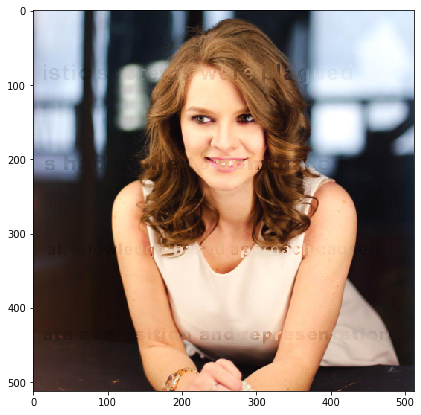

Iter # 180 , PSRN NOISY:  18.140272665126883 ; PSRN GT:  34.297880242822814


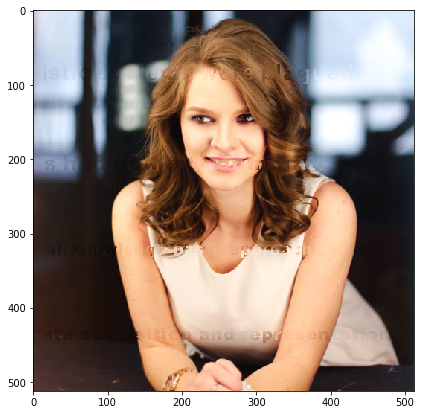

Iter # 200 , PSRN NOISY:  18.204938838383697 ; PSRN GT:  34.93684010922373


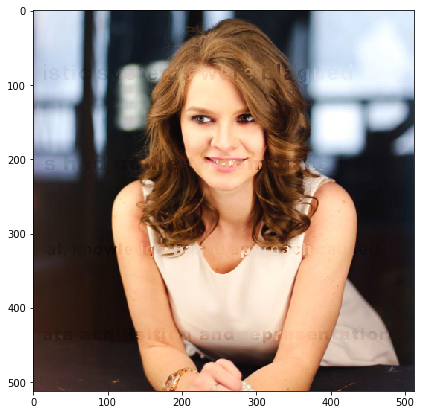

Iter # 220 , PSRN NOISY:  18.240009621341713 ; PSRN GT:  35.530752885041295


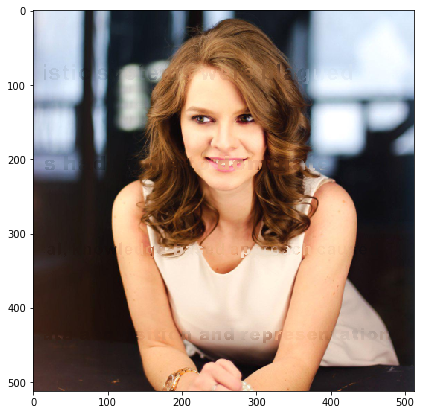

Iter # 240 , PSRN NOISY:  18.295577094040254 ; PSRN GT:  34.91794265305107


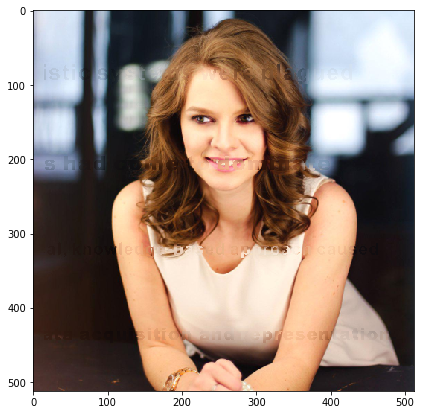

Iter # 260 , PSRN NOISY:  18.034593822111635 ; PSRN GT:  35.87491620338854


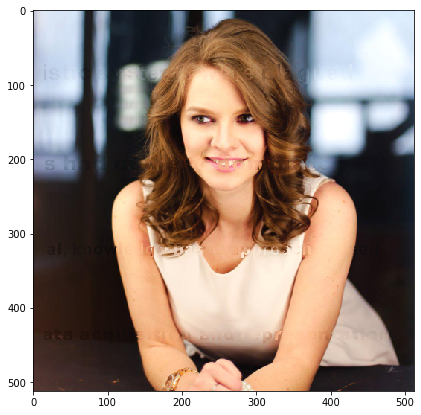

Iter # 280 , PSRN NOISY:  18.07311265824532 ; PSRN GT:  35.986230060953076


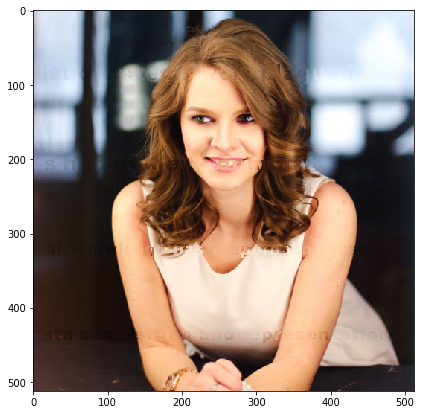

Iter # 300 , PSRN NOISY:  18.148417311581422 ; PSRN GT:  37.61302374750883


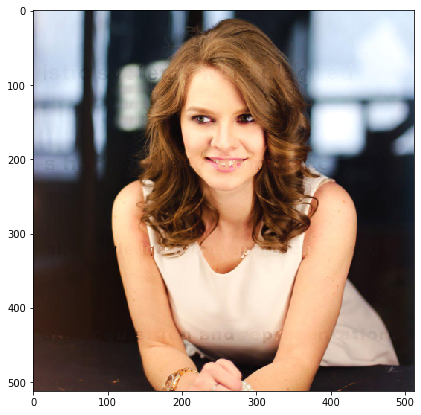

Iter # 320 , PSRN NOISY:  18.074975374908696 ; PSRN GT:  37.07234504274996


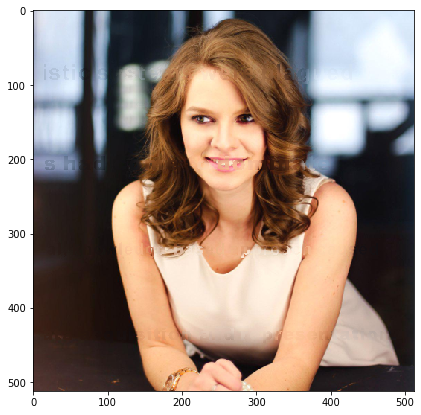

Iter # 340 , PSRN NOISY:  17.61483283517192 ; PSRN GT:  30.245273124104788


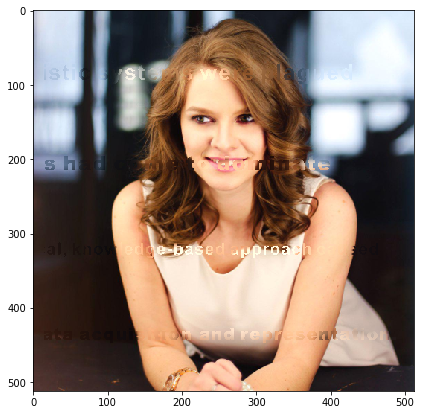

Iter # 360 , PSRN NOISY:  16.8850909577295 ; PSRN GT:  27.691172931939395


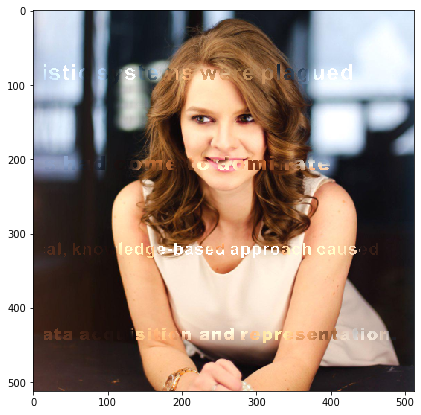

Iter # 380 , PSRN NOISY:  17.645922136266773 ; PSRN GT:  28.81313250977088


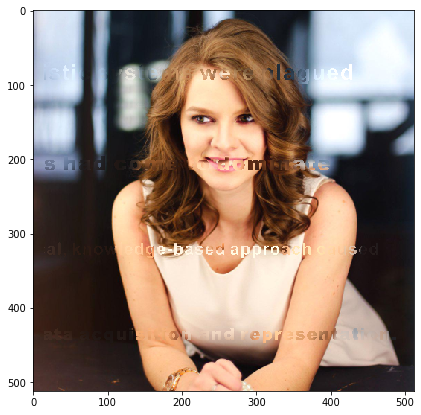

Iter # 400 , PSRN NOISY:  18.199007982204854 ; PSRN GT:  29.72391288095639


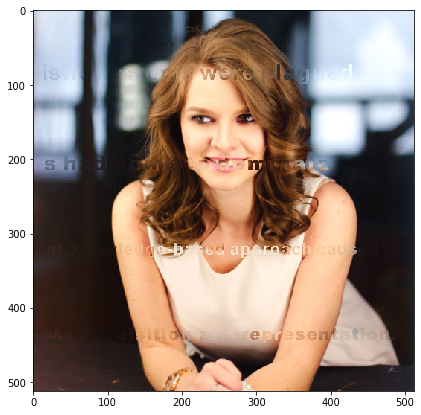

Iter # 420 , PSRN NOISY:  18.46274827445489 ; PSRN GT:  30.29369176023188


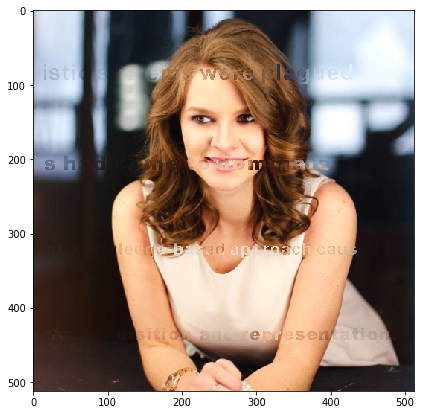

Iter # 440 , PSRN NOISY:  18.221975423654605 ; PSRN GT:  30.466350409631985


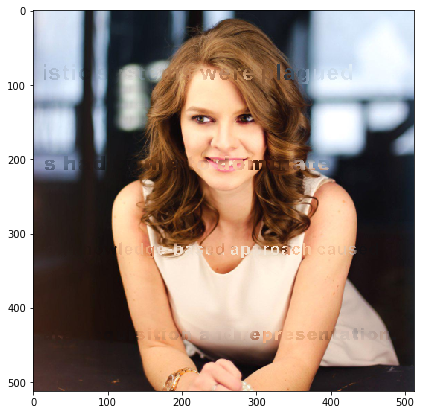

Iter # 460 , PSRN NOISY:  18.437411761168384 ; PSRN GT:  30.845998518954154


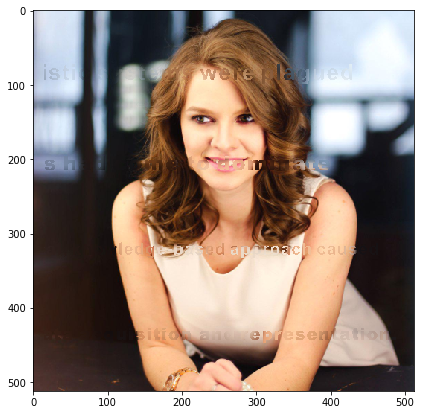

Iter # 480 , PSRN NOISY:  18.22718299320982 ; PSRN GT:  31.315806858654422


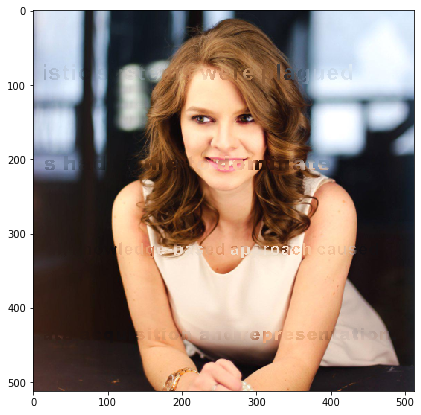

Iter # 500 , PSRN NOISY:  18.08544780786524 ; PSRN GT:  32.027133271953396


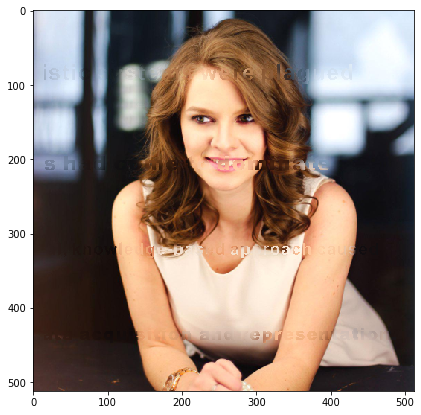

Iter # 520 , PSRN NOISY:  18.108609829560525 ; PSRN GT:  33.03107456534125


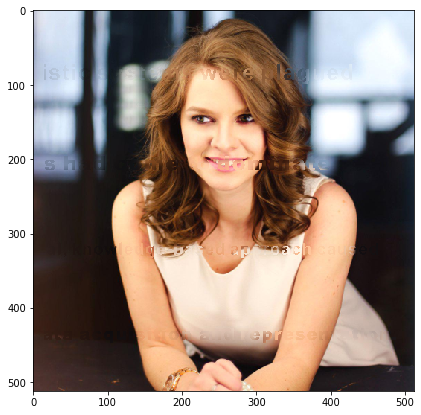

Iter # 540 , PSRN NOISY:  18.31387305743591 ; PSRN GT:  32.92576751595524


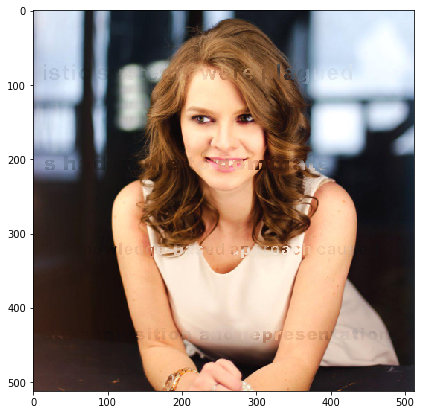

Iter # 560 , PSRN NOISY:  18.084629074483168 ; PSRN GT:  33.11785729587007


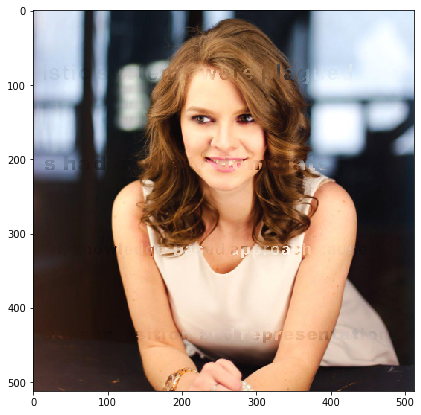

Iter # 580 , PSRN NOISY:  18.197354520015416 ; PSRN GT:  34.35519491542148


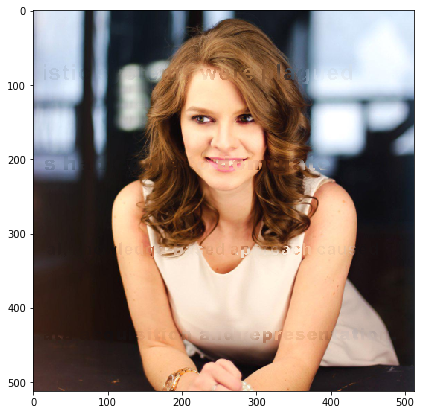

Iter # 600 , PSRN NOISY:  18.39453363195081 ; PSRN GT:  34.72885978011814


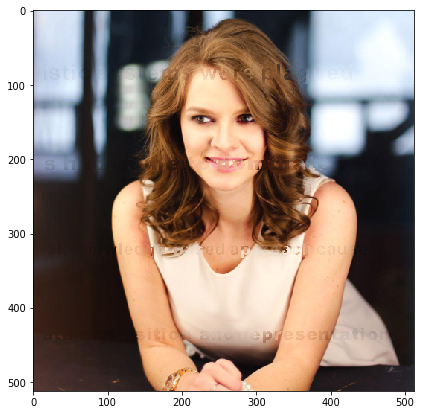

Iter # 620 , PSRN NOISY:  18.184038302232842 ; PSRN GT:  36.877318253422594


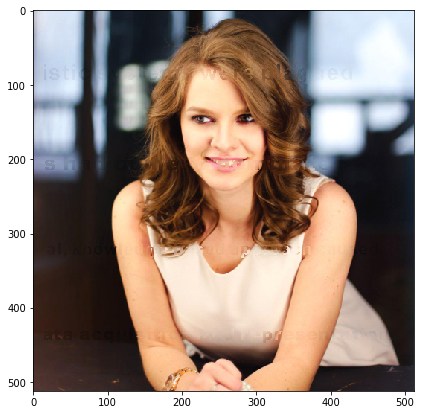

Iter # 640 , PSRN NOISY:  18.253171362952003 ; PSRN GT:  37.51576718781283


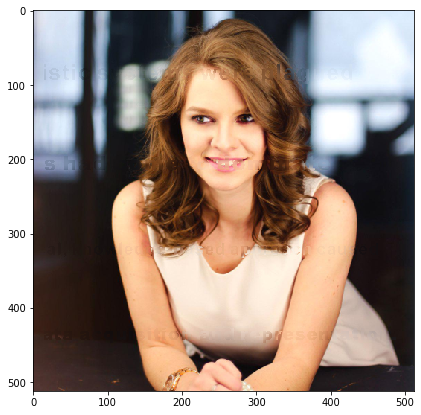

Iter # 660 , PSRN NOISY:  18.254606786951562 ; PSRN GT:  37.9229006315886


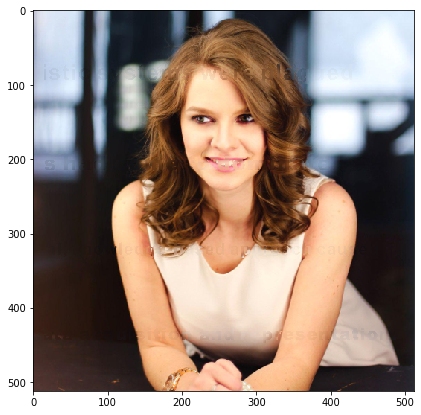

Iter # 680 , PSRN NOISY:  18.116687606026364 ; PSRN GT:  38.244231968201184


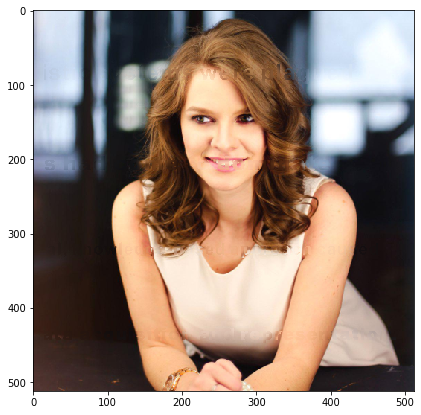

Iter # 700 , PSRN NOISY:  18.145313952436016 ; PSRN GT:  37.69608779260515


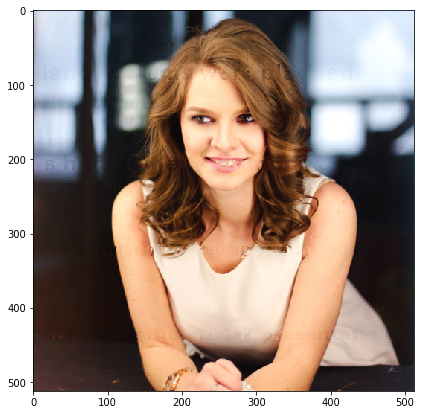

Iter # 720 , PSRN NOISY:  18.323920332765383 ; PSRN GT:  38.3830626117733


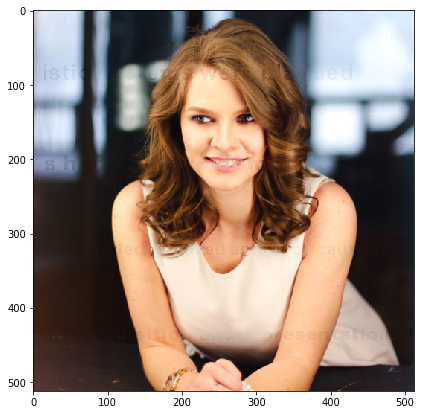

Iter # 740 , PSRN NOISY:  18.26758888502578 ; PSRN GT:  39.14542326512319


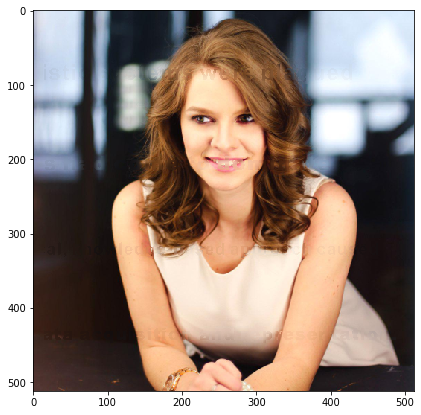

Iter # 760 , PSRN NOISY:  18.279571108265255 ; PSRN GT:  39.671206655929836


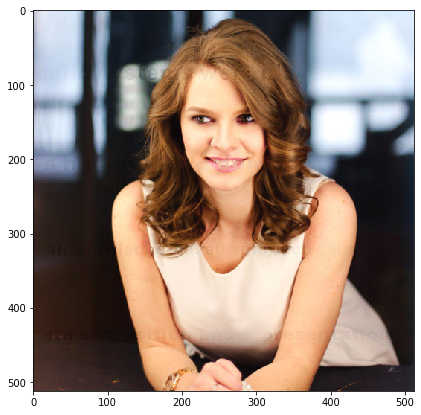

Iter # 780 , PSRN NOISY:  18.191575966835597 ; PSRN GT:  39.08834086929426


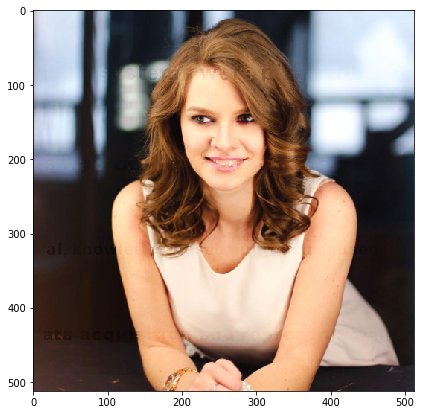

Iter # 800 , PSRN NOISY:  18.006961581227536 ; PSRN GT:  38.33252328608286


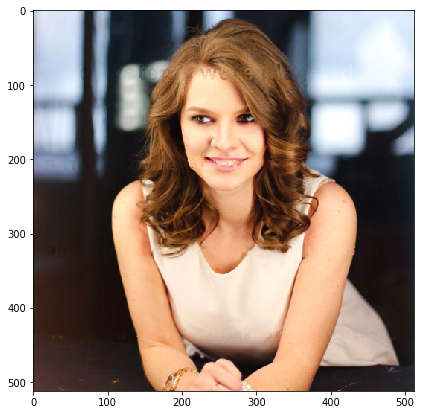

Iter # 820 , PSRN NOISY:  18.242160290272132 ; PSRN GT:  38.42769190930274


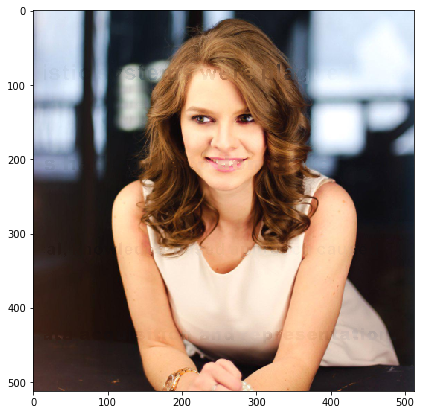

Iter # 840 , PSRN NOISY:  18.073476283714335 ; PSRN GT:  39.090492830688945


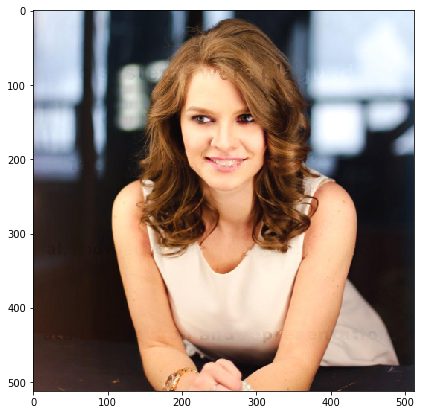

Iter # 860 , PSRN NOISY:  18.175809310663166 ; PSRN GT:  38.734844623961195


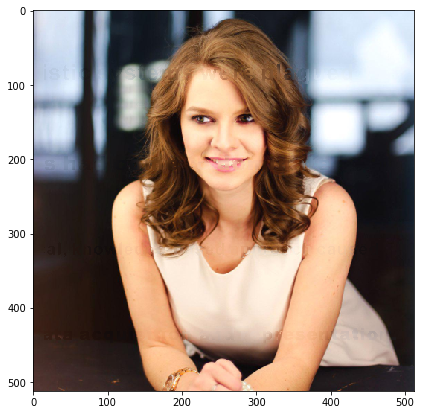

Iter # 880 , PSRN NOISY:  17.956819688933425 ; PSRN GT:  38.521923215629506


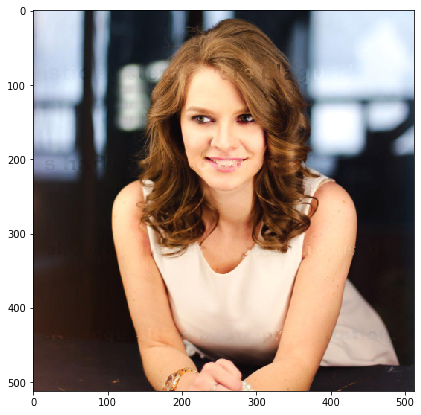

Iter # 900 , PSRN NOISY:  18.10819760898208 ; PSRN GT:  39.49654827622169


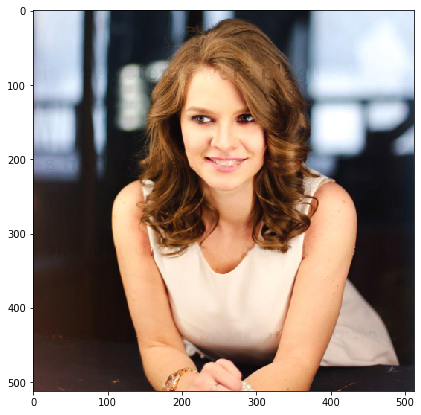

Iter # 920 , PSRN NOISY:  18.039287109169024 ; PSRN GT:  40.531787200299156


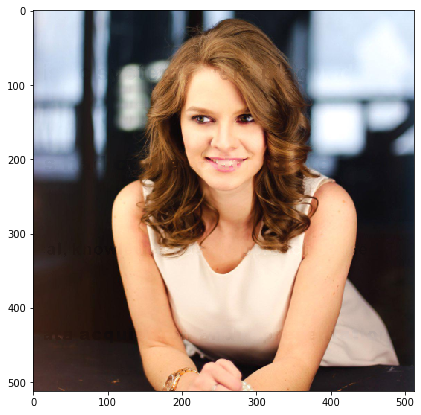

Iter # 940 , PSRN NOISY:  17.962817366403897 ; PSRN GT:  40.71781289467668


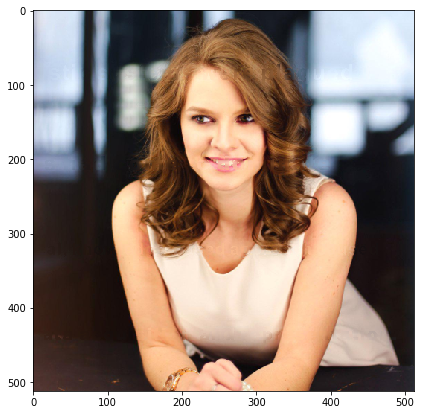

Iter # 960 , PSRN NOISY:  18.12785575164194 ; PSRN GT:  38.75617830967092


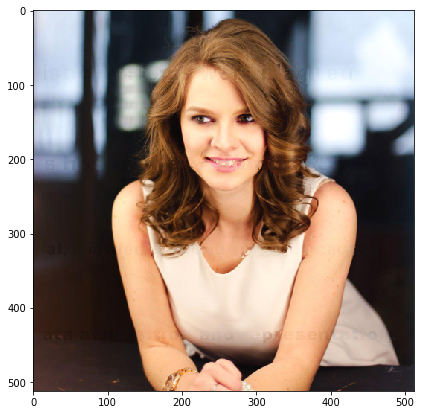

Iter # 980 , PSRN NOISY:  18.063837141637727 ; PSRN GT:  38.6923954492103


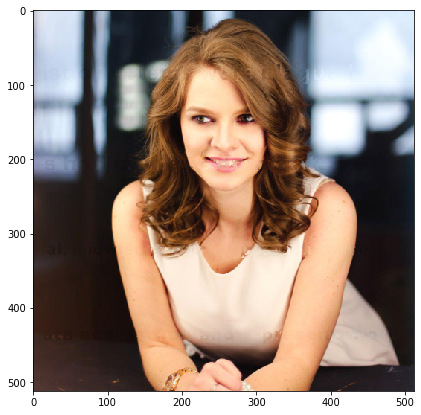

Iter # 1000 , PSRN NOISY:  18.045323020064043 ; PSRN GT:  39.86116580646929


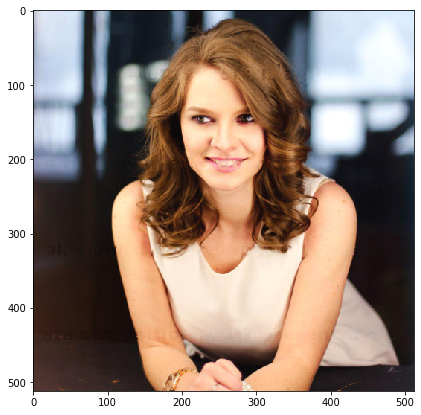

Iter # 1020 , PSRN NOISY:  18.05508343840647 ; PSRN GT:  38.503894056867175


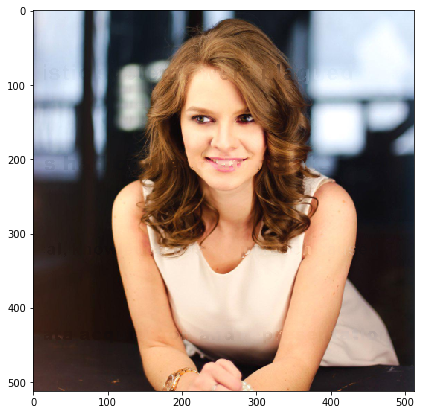

Iter # 1040 , PSRN NOISY:  15.586476757340257 ; PSRN GT:  22.586421541779206


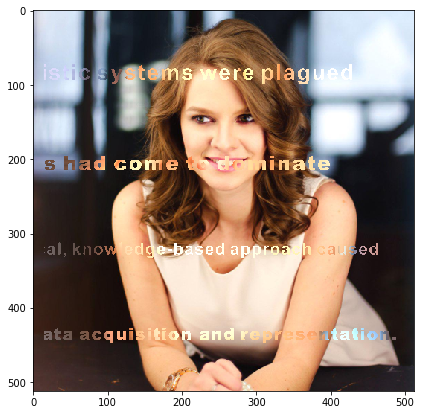

Iter # 1060 , PSRN NOISY:  15.416710907796197 ; PSRN GT:  19.121103605663844


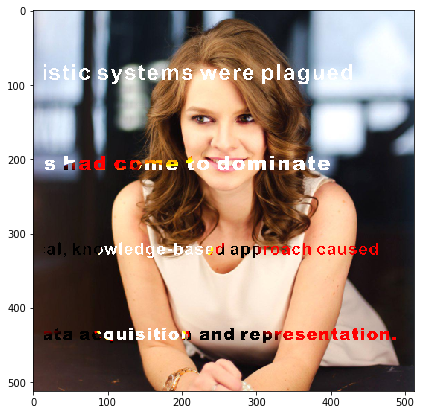

KeyboardInterrupt: 

In [27]:
for i in range(1500):
    model.train_on_batch([input_meshgrid[None, :, :, :], masked_image[None, :, :, :], mask_image[None, :, :, None]], np.zeros((1, height, width)))
    
    if i % 20 == 0:
        inpainted_image = np.clip(base_model.predict(input_meshgrid[None, :, :, :])[0], 0, 255).astype(np.uint8)
        out = (masked_image * mask_image[:, :, None] + inpainted_image * (1 - mask_image[:, :, None])).astype(np.uint8)
        cv2.imwrite("v3_inp_kate_inpainted_image_"+str(i+1500)+".png", inpainted_image)
        cv2.imwrite("v3_inp_kate_out_"+str(i+1500)+".png", out)
        
        psrn_noisy = compare_psnr(masked_image, out) 
        psrn_gt = compare_psnr(image, out)
        print("Iter #", i, ", PSRN NOISY: ", psrn_noisy, "; PSRN GT: ", psrn_gt)
        
        plt.figure(figsize=(7, 7))
        plt.imshow(out[:,:,::-1])
        plt.show()



In [28]:
model.save("model_inp_kate.h5")
base_model.save("base_model_inp_kate.h5")